In [31]:
import numpy as np
import pandas as pd
import os, sys
import ast
import re

import copy
import scipy.optimize as optim

import matplotlib.pyplot as plt
import seaborn as sns

## Load processed samples and set up

In [3]:
results_folder = './results/'
os.makedirs(results_folder, exist_ok = True)
os.makedirs(results_folder+'figures/', exist_ok = True)

In [4]:
all_pre = pd.read_csv('~/ceph/TransformedDat/pmg_preprocessed.csv', index_col = [0,1])

In [5]:
samples = pd.unique(all_pre.index.get_level_values(0))

In [8]:
# Possible aliases and their colorcodes for plotting
aliases = ['Wg', 'Byn', 'Hkb', 'Tll', 'Fkh']#'Cic'
code_colors = [np.array([255,0,0])/256, 
              np.array([4, 210, 190])/256, 
              np.array([174, 94, 255])/256, 
              np.array([255, 52, 233])/256,  
              np.array([10, 185, 243])/256]

In [9]:
my_cmap = dict(zip(aliases, code_colors))

In [101]:
no_dsRed = ['Byn_200901', 'Byn_200902', 'Byn_200903','Byn_200904',
                           'Tll_200917', 'Tll_200918','Tll_200920', 'Tll_200921', 
                           'Wg_201003', 'Wg_201005','Wg_201006','Wg_201114',
                           'Hkb_201006','Hkb_201110', 'Hkb_210415', 'Hkb_210416',
                       'Fkh_200906', 'Fkh_200907','Fkh_200908', 'Fkh_200909']

In [14]:
to_cons = {}
for samp in samples:
    to_cons[samp] = all_pre.loc[[samp]]

## Division times

In [18]:
with open('./results/Division_times.txt') as f:
    content = f.read()
division_times = ast.literal_eval(content)

### Synchronize

In [19]:
def map_to_cycle(x):
    if x in range(1,11):
        return 12
    elif x in range(11,27):
        return 13
    elif x>26:
        return 14
    else:
        #print('Something is off')
        return 11       

for samp in samples:
    to_cons[samp]['Synch_time'] = to_cons[samp]['Time'] -(division_times[samp][0]+1)
    to_cons[samp]['Cycle'] = to_cons[samp]['Synch_time'].map(lambda x: map_to_cycle(x))
    to_cons[samp]['Gene'] = samp.split('_')[0]

In [20]:
max_times = {}
for samp in samples:
    max_times[samp]=max(to_cons[samp]['Synch_time'])
max_times = pd.Series(max_times)#.to_frame()

In [21]:
max(max_times.loc[samples])

91

In [22]:
max_times = max_times.to_frame()

In [23]:
last_common_synch_time = min([max(to_cons[samp]['Synch_time']) for samp in samples])

In [24]:
last_common_synch_time

78

## Pick biggest template sample

### Pick sample with most nuclei after last common synch time

In [27]:
import copy
mean_sizes = {}
for samp in no_dsRed:
    dat = to_cons[samp].query('Synch_time>=78')
    #print(samp)
    mean_sizes[samp] = dat.groupby('Synch_time').size().mean()
mean_sizes = pd.Series(mean_sizes).sort_values()    

In [28]:
template_samp = mean_sizes.index.values[-1]
template_samp

'Wg_201003'

## Aligning with ICP

In [30]:
from ICP import icp_nn

In [80]:
def xy_rot(theta):
    t = np.array([[np.cos(theta),np.sin(theta), 0], [-np.sin(theta),np.cos(theta), 0], [0,0,1]])
    return t
def rotate(A, theta):
    #A should be centered
    t = xy_rot(theta)
    return np.matmul(A, t)

def align_two_samples(A, B, max_iterations = 30, scaling = False, plot = False):
    A_rot = A[['X', 'Y', 'Z']]
    B_rot = B[['X', 'Y', 'Z']]
    inter = min(A_rot.shape[0], B_rot.shape[0])
    if A_rot.shape[0] > B_rot.shape[0]:
        #print('B smaller')
        nucl = np.random.choice(A_rot.shape[0], inter, replace = False)
        A_rot = A_rot.iloc[nucl,:]
    else:
        nucl = np.random.choice(B_rot.shape[0], inter, replace = False)
        B_rot = B_rot.iloc[nucl,:]
    A_rot = A_rot-np.mean(A_rot,0)
    B_rot = B_rot-np.mean(B_rot,0)
    opt_err = np.inf
    #plt.figure()

    def to_opt_shape(v):
        scale, theta = v
        AA = rotate(A_rot, theta)
        AA = AA*scale
        cur_T, cur_transformed, _, _, cur_i, cur_final_err, all_means = icp_nn(AA, 
                                                                       B_rot, 
                                                                       max_iterations=max_iterations, 
                                                                       scaling = False,
                                                                       plot = plot)
        return cur_final_err
    res = optim.differential_evolution(to_opt_shape, 
                              #x0 = [0], 
                              bounds = [(0.8, 1.2), (0, 2*np.pi)])#,#[0.8, 1.2], 
                              #args = (c0,))
    #print(res)
    final_c, final_theta = res.x
    AA = rotate(A_rot, final_theta)
    AA = AA * final_c

    T, transformed, _, _, cur_i, opt_err, final_all_means = icp_nn(AA, 
                                                                       B_rot, 
                                                                       max_iterations=max_iterations, 
                                                                       scaling = False,
                                                                       plot = plot)

    transformed = pd.DataFrame(transformed.T, columns = ['X', 'Y', 'Z'])
    #plt.title('ICP error')
    #plt.xlabel('Iteration')
    return transformed, T, final_c, final_theta, opt_err, final_all_means#, zero_means

In [81]:
import copy
transformed = {}
T = {}
final_theta = {}
final_c = {}
opt_err = {}
centr = {}
all_means = {}
#zero_means = {}
for samp in samples:
    print(samp)
    samp1 = samp
    samp2 = template_samp
    last_common_time = min([max(to_cons[samp1]['Synch_time']), max(to_cons[samp2]['Synch_time'])])
    A = copy.deepcopy(to_cons[samp1].query('Synch_time == '+str(last_common_time)))#.sort_values('Z', ascending = False)
    B = copy.deepcopy(to_cons[samp2].query('Synch_time == '+str(last_common_time)))#.sort_values('Z', ascending = False)
    transformed[samp], T[samp], final_c[samp], final_theta[samp],opt_err[samp], all_means[samp] = align_two_samples(A, B, scaling = False)#, plot = True)
    print(final_c[samp], final_theta[samp])
    centr[samp] = np.mean(A,0)

Byn_200901
1.020376672604772 2.6405705155179287
Byn_200902


/mnt/home/mavdeeva/.local/lib/python3.8/site-packages/numpy/core/fromnumeric.py:3417: FutureWarning: Dropping of nuisance columns in DataFrame reductions (with 'numeric_only=None') is deprecated; in a future version this will raise TypeError.  Select only valid columns before calling the reduction.
  return mean(axis=axis, dtype=dtype, out=out, **kwargs)


1.005324681252848 1.3260279596262814
Byn_200903


/mnt/home/mavdeeva/.local/lib/python3.8/site-packages/numpy/core/fromnumeric.py:3417: FutureWarning: Dropping of nuisance columns in DataFrame reductions (with 'numeric_only=None') is deprecated; in a future version this will raise TypeError.  Select only valid columns before calling the reduction.
  return mean(axis=axis, dtype=dtype, out=out, **kwargs)


1.0070320395658177 2.5111868182831367
Byn_200904


/mnt/home/mavdeeva/.local/lib/python3.8/site-packages/numpy/core/fromnumeric.py:3417: FutureWarning: Dropping of nuisance columns in DataFrame reductions (with 'numeric_only=None') is deprecated; in a future version this will raise TypeError.  Select only valid columns before calling the reduction.
  return mean(axis=axis, dtype=dtype, out=out, **kwargs)


1.0204326857369548 1.786706240438995
Tll_200917


/mnt/home/mavdeeva/.local/lib/python3.8/site-packages/numpy/core/fromnumeric.py:3417: FutureWarning: Dropping of nuisance columns in DataFrame reductions (with 'numeric_only=None') is deprecated; in a future version this will raise TypeError.  Select only valid columns before calling the reduction.
  return mean(axis=axis, dtype=dtype, out=out, **kwargs)


1.0048560030724636 0.4332556287189844
Tll_200918


/mnt/home/mavdeeva/.local/lib/python3.8/site-packages/numpy/core/fromnumeric.py:3417: FutureWarning: Dropping of nuisance columns in DataFrame reductions (with 'numeric_only=None') is deprecated; in a future version this will raise TypeError.  Select only valid columns before calling the reduction.
  return mean(axis=axis, dtype=dtype, out=out, **kwargs)


1.0200907387855764 5.959538313488325
Tll_200920


/mnt/home/mavdeeva/.local/lib/python3.8/site-packages/numpy/core/fromnumeric.py:3417: FutureWarning: Dropping of nuisance columns in DataFrame reductions (with 'numeric_only=None') is deprecated; in a future version this will raise TypeError.  Select only valid columns before calling the reduction.
  return mean(axis=axis, dtype=dtype, out=out, **kwargs)


1.0646275306264728 5.768291823869031
Tll_200921


/mnt/home/mavdeeva/.local/lib/python3.8/site-packages/numpy/core/fromnumeric.py:3417: FutureWarning: Dropping of nuisance columns in DataFrame reductions (with 'numeric_only=None') is deprecated; in a future version this will raise TypeError.  Select only valid columns before calling the reduction.
  return mean(axis=axis, dtype=dtype, out=out, **kwargs)


1.0599450730753812 6.189021445831888
Wg_201003


/mnt/home/mavdeeva/.local/lib/python3.8/site-packages/numpy/core/fromnumeric.py:3417: FutureWarning: Dropping of nuisance columns in DataFrame reductions (with 'numeric_only=None') is deprecated; in a future version this will raise TypeError.  Select only valid columns before calling the reduction.
  return mean(axis=axis, dtype=dtype, out=out, **kwargs)


1.0000000000000002 0.037234687247836185
Wg_201005


/mnt/home/mavdeeva/.local/lib/python3.8/site-packages/numpy/core/fromnumeric.py:3417: FutureWarning: Dropping of nuisance columns in DataFrame reductions (with 'numeric_only=None') is deprecated; in a future version this will raise TypeError.  Select only valid columns before calling the reduction.
  return mean(axis=axis, dtype=dtype, out=out, **kwargs)


1.034336811144777 0.7466312318738346
Wg_201006


/mnt/home/mavdeeva/.local/lib/python3.8/site-packages/numpy/core/fromnumeric.py:3417: FutureWarning: Dropping of nuisance columns in DataFrame reductions (with 'numeric_only=None') is deprecated; in a future version this will raise TypeError.  Select only valid columns before calling the reduction.
  return mean(axis=axis, dtype=dtype, out=out, **kwargs)


1.0219556261059617 0.3971464792811932
Wg_201114


/mnt/home/mavdeeva/.local/lib/python3.8/site-packages/numpy/core/fromnumeric.py:3417: FutureWarning: Dropping of nuisance columns in DataFrame reductions (with 'numeric_only=None') is deprecated; in a future version this will raise TypeError.  Select only valid columns before calling the reduction.
  return mean(axis=axis, dtype=dtype, out=out, **kwargs)


1.0508305708162717 3.7510855363264413
Hkb_201006


/mnt/home/mavdeeva/.local/lib/python3.8/site-packages/numpy/core/fromnumeric.py:3417: FutureWarning: Dropping of nuisance columns in DataFrame reductions (with 'numeric_only=None') is deprecated; in a future version this will raise TypeError.  Select only valid columns before calling the reduction.
  return mean(axis=axis, dtype=dtype, out=out, **kwargs)


1.057912546185043 1.2470215616972067
Hkb_201110


/mnt/home/mavdeeva/.local/lib/python3.8/site-packages/numpy/core/fromnumeric.py:3417: FutureWarning: Dropping of nuisance columns in DataFrame reductions (with 'numeric_only=None') is deprecated; in a future version this will raise TypeError.  Select only valid columns before calling the reduction.
  return mean(axis=axis, dtype=dtype, out=out, **kwargs)


1.0103796752328658 5.950676442362279
Hkb_210415


/mnt/home/mavdeeva/.local/lib/python3.8/site-packages/numpy/core/fromnumeric.py:3417: FutureWarning: Dropping of nuisance columns in DataFrame reductions (with 'numeric_only=None') is deprecated; in a future version this will raise TypeError.  Select only valid columns before calling the reduction.
  return mean(axis=axis, dtype=dtype, out=out, **kwargs)


1.036897470379508 0.24468428204149895
Hkb_210416


/mnt/home/mavdeeva/.local/lib/python3.8/site-packages/numpy/core/fromnumeric.py:3417: FutureWarning: Dropping of nuisance columns in DataFrame reductions (with 'numeric_only=None') is deprecated; in a future version this will raise TypeError.  Select only valid columns before calling the reduction.
  return mean(axis=axis, dtype=dtype, out=out, **kwargs)


1.0121840307644232 1.6120866985146618
Fkh_200906


/mnt/home/mavdeeva/.local/lib/python3.8/site-packages/numpy/core/fromnumeric.py:3417: FutureWarning: Dropping of nuisance columns in DataFrame reductions (with 'numeric_only=None') is deprecated; in a future version this will raise TypeError.  Select only valid columns before calling the reduction.
  return mean(axis=axis, dtype=dtype, out=out, **kwargs)


0.970911006846416 0.27665936862072416
Fkh_200907


/mnt/home/mavdeeva/.local/lib/python3.8/site-packages/numpy/core/fromnumeric.py:3417: FutureWarning: Dropping of nuisance columns in DataFrame reductions (with 'numeric_only=None') is deprecated; in a future version this will raise TypeError.  Select only valid columns before calling the reduction.
  return mean(axis=axis, dtype=dtype, out=out, **kwargs)


0.9875491260962352 1.448096814840765
Fkh_200908


/mnt/home/mavdeeva/.local/lib/python3.8/site-packages/numpy/core/fromnumeric.py:3417: FutureWarning: Dropping of nuisance columns in DataFrame reductions (with 'numeric_only=None') is deprecated; in a future version this will raise TypeError.  Select only valid columns before calling the reduction.
  return mean(axis=axis, dtype=dtype, out=out, **kwargs)


1.0110686761796868 3.89253528756193
Fkh_200909


/mnt/home/mavdeeva/.local/lib/python3.8/site-packages/numpy/core/fromnumeric.py:3417: FutureWarning: Dropping of nuisance columns in DataFrame reductions (with 'numeric_only=None') is deprecated; in a future version this will raise TypeError.  Select only valid columns before calling the reduction.
  return mean(axis=axis, dtype=dtype, out=out, **kwargs)


0.9940799182500588 4.960919072470768


/mnt/home/mavdeeva/.local/lib/python3.8/site-packages/numpy/core/fromnumeric.py:3417: FutureWarning: Dropping of nuisance columns in DataFrame reductions (with 'numeric_only=None') is deprecated; in a future version this will raise TypeError.  Select only valid columns before calling the reduction.
  return mean(axis=axis, dtype=dtype, out=out, **kwargs)


In [25]:
import copy
transformed = {}
T = {}
final_theta = {}
final_c = {}
opt_err = {}
centr = {}
all_means = {}
#zero_means = {}
for samp in samples:
    print(samp)
    samp1 = samp
    samp2 = template_samp
    last_common_time = min([max(to_cons[samp1]['Synch_time']), max(to_cons[samp2]['Synch_time'])])
    A = copy.deepcopy(to_cons[samp1].query('Synch_time == '+str(last_common_time)))#.sort_values('Z', ascending = False)
    B = copy.deepcopy(to_cons[samp2].query('Synch_time == '+str(last_common_time)))#.sort_values('Z', ascending = False)
    transformed[samp], T[samp], final_c[samp], final_theta[samp],opt_err[samp], all_means[samp] = align_two_samples(A, B, scaling = False)#, plot = True)
    print(final_c[samp], final_theta[samp])
    centr[samp] = np.mean(A,0)

Byn_200806
0.9974228560417513 5.989635762928177
Byn_200902
1.0163672548072604 1.411261149551014
Hkb_200718
0.9662554930638081 2.625242320448123
Hkb_200808
1.017704673779702 2.8424911887487263
Hkb_201006
1.0604081289529035 1.4446868802795902
Hkb_201007
1.1290106705773457 2.780153167952646
Tll_200802
1.0268165171043255 3.2944829709455346
Tll_200809
1.019221494709944 4.571928737132855
Tll_200917
0.9994656664648157 0.13148794474294379
Tll_200918
1.0249127094981405 5.855297485847744
Wg_200804
0.962951814049885 6.266132945818883
Wg_200808
1.0421344442474936 0.9449784334912641
Wg_201003
0.9999999999999999 0.01299546315218425
Wg_201005
1.0308801587571834 0.7528878620684186
Fkh_200805
1.0791393428388516 6.005891901766665
Fkh_200808
1.048086764926478 1.817746953818733
Fkh_200907
0.992058945461181 1.4501633580984192
Sna_201102
1.0529484891695555 3.6383846137795937
Byn_200904
1.0147466336047557 1.908285414403061
Sna_201103
1.1062621204665932 0.4595595828243333
Byn_200903


/mnt/home/mavdeeva/.local/lib/python3.6/site-packages/ipykernel_launcher.py:22: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


1.004973674883297 2.338901502046106
Wg_201006
1.0222107620578667 0.9626707951490505
Tll_200921
1.0643763305881044 0.00021902517631211538
Cic_200912
1.0674136001888646 4.217721319685083
Cic_200911
1.0415341166238403 2.659052006344985
Fkh_200909
0.9969107105460409 4.978569890776106
Tll_200920
1.065313095390341 5.762990289947741
Fkh_200906
0.9752935558356214 0.22616679078541901
Wg_201114
1.0554744137365133 3.747028408378792
Fkh_200908
1.0159397996568453 3.7467498394536913
Cic_200909
1.0683859257874153 3.0034451816869026
Hkb_201110
1.0084578554442984 5.956344860000557
Cic_200913
1.0955524142422426 5.410028150873885
Hkb_210414
1.039964475457213 1.5346796605826982
Hkb_210415
1.0353000145123126 0.284603609164773
Hkb_210416
1.0080407908333615 1.4818439495503375
Byn_200901
1.0174229310778606 2.7640199931067735


<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

In [ ]:
## Apply transforms

In [82]:
import copy
icp_transformed = {}
for samp in samples:
    icp_transformed[samp] = copy.deepcopy(to_cons[samp])
    dat = to_cons[samp][['X', 'Y', 'Z']]
    cent = centr[samp][['X', 'Y', 'Z']]
    th = final_theta[samp]
    c = final_c[samp]
    rotated = np.matmul((dat - cent)*c, xy_rot(th))# + c
    t = T[samp]
    rotated = np.matmul(rotated, t[:3, :3].T)+t[:3,3]
    icp_transformed[samp][['X', 'Y', 'Z']] = rotated

In [83]:
all_icp = pd.concat(icp_transformed).droplevel(0)

In [84]:
all_icp.index.names = ['sample', 'segment']

In [87]:
all_icp.to_csv('./dat/icp_transformed_scaled.csv')

In [85]:
from sklearn.decomposition import PCA
dat = all_icp.loc[no_dsRed].query('Synch_time == 78')
pc = PCA(n_components = 3)
pc.fit(dat[['X', 'Y', 'Z']])
pc_icp = all_icp.copy()
pc_icp[['Z', 'X', 'Y']] = pc.transform(pc_icp[['X', 'Y', 'Z']])
pc_icp['Z'] = -pc_icp['Z']

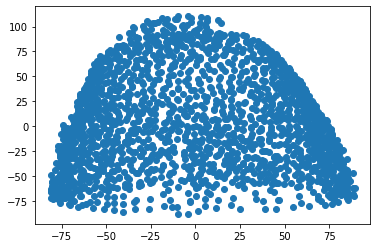

In [86]:
dt = pc_icp.loc['Tll_200917'].query('Synch_time == 78')
plt.scatter(dt['X'], dt['Z'])

In [90]:
pc_icp.to_csv('./dat/icp_transformed_scaled_after_pca.csv')

In [88]:
pd.Series(final_c).to_frame().to_csv('./dat/final_c.csv')

In [89]:
pd.Series(final_theta).to_frame().to_csv('./dat/final_theta.csv')

## Plot results

In [92]:
all_icp = pd.read_csv('./dat/icp_transformed_scaled.csv', index_col = [0,1])

In [93]:
icp_transformed = {}
for samp in no_dsRed:
    icp_transformed[samp] = all_icp.loc[samp]

In [106]:
from sklearn.decomposition import PCA
dat = all_icp.loc[no_dsRed].query('Synch_time == 78')
pc = PCA(n_components = 3)
pc.fit(dat[['X', 'Y', 'Z']])
pcs = pc.transform(dat[['X', 'Y', 'Z']])
pcs[:,0] = -pcs[:,0]
conc = pd.concat([icp_transformed[samp].query('Synch_time == '+str(max(icp_transformed[samp]['Synch_time']))) for samp in no_dsRed],
          axis = 0,
         keys = no_dsRed)
pcs_last = pc.transform(conc[['X', 'Y', 'Z']])
pcs_last[:,0] = -pcs_last[:,0]

<AxesSubplot:>

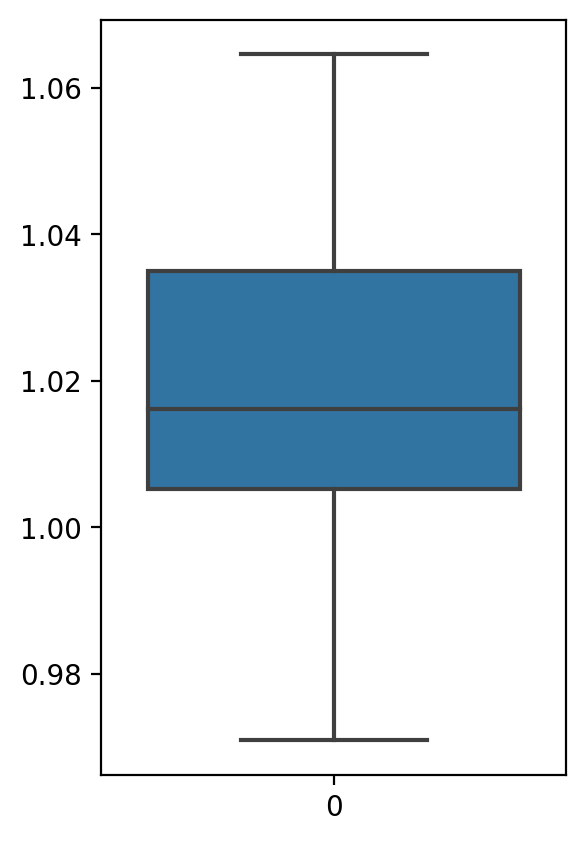

In [94]:
fc = pd.Series(final_c).to_frame()
plt.figure(figsize = (3,5), dpi = 200)
sns.boxplot(data = fc)

In [109]:
#Reorder samp
no_dsRed = ['Byn_200901',
            'Tll_200917',
            'Wg_201003',
            'Hkb_201006',
            'Fkh_200906',
            'Byn_200902',
             'Tll_200918',
             'Wg_201005',
             'Hkb_201110',
            'Fkh_200907',
            'Byn_200903',
             'Tll_200920',
            'Wg_201006',
             'Hkb_210415',
             'Fkh_200908',
             'Byn_200904',
             'Tll_200921',
             'Wg_201114',
             'Hkb_210416',
             'Fkh_200909']

/tmp/ipykernel_1089728/2733469832.py:13: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


Text(0.5, 0.98, 'Posterior View Before Registration')

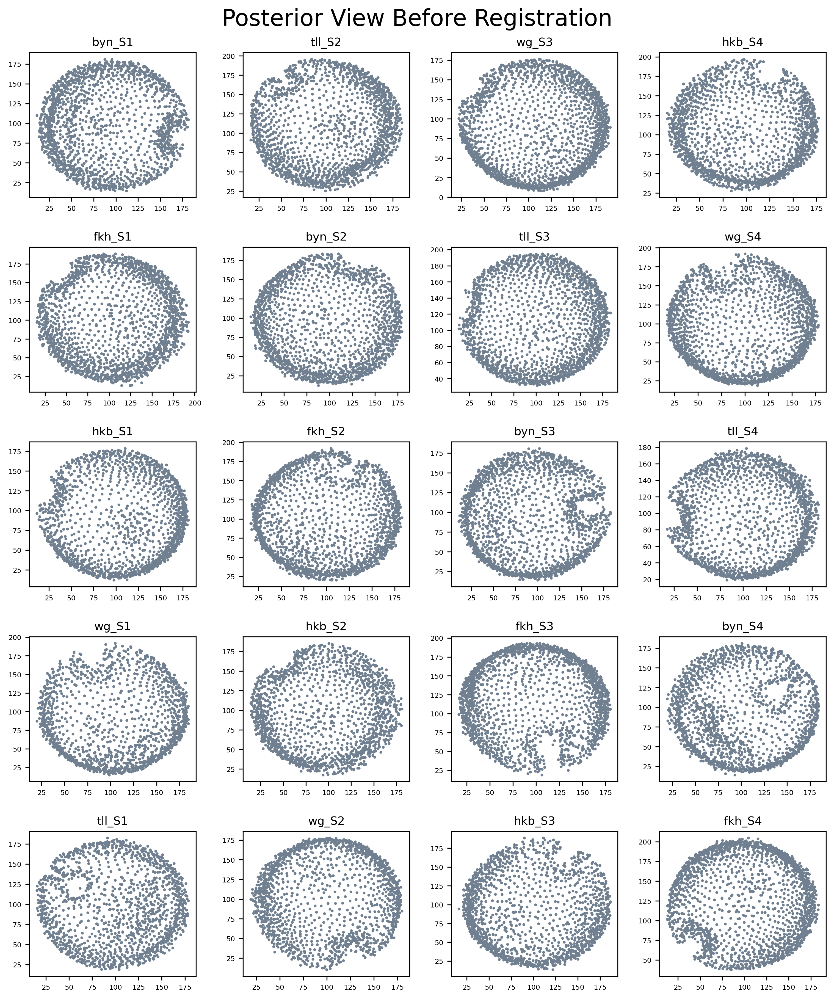

In [110]:
# scaling
import matplotlib.gridspec as gridspec
fig = plt.figure(dpi = 300, figsize = (10,12), constrained_layout=True)
my = gridspec.GridSpec(ncols=4, nrows=5, figure=fig, wspace=0.1, hspace=0.1)
for i, samp in enumerate(no_dsRed):
    row = i // 4
    col = i % 4
    ax = fig.add_subplot(my[row, col])
    ax.tick_params(labelsize= 6)
    tr = to_cons[samp].query('Synch_time == '+str(max(to_cons[samp]['Synch_time'])))
    ax.scatter(tr['X'], tr['Y'], s = 2, c = 'slategrey')
    ax.set_title(samp.lower().split('_')[0]+'_S'+str(col+1), fontsize = 10)
plt.tight_layout()
plt.suptitle('Posterior View Before Registration', fontsize = 20)
#plt.savefig(results_folder+'figures/PV_before_registration_tp_last_no_sample_names.pdf')

/tmp/ipykernel_1089728/778406030.py:14: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


Text(0.5, 0.98, 'Posterior View After Registration')

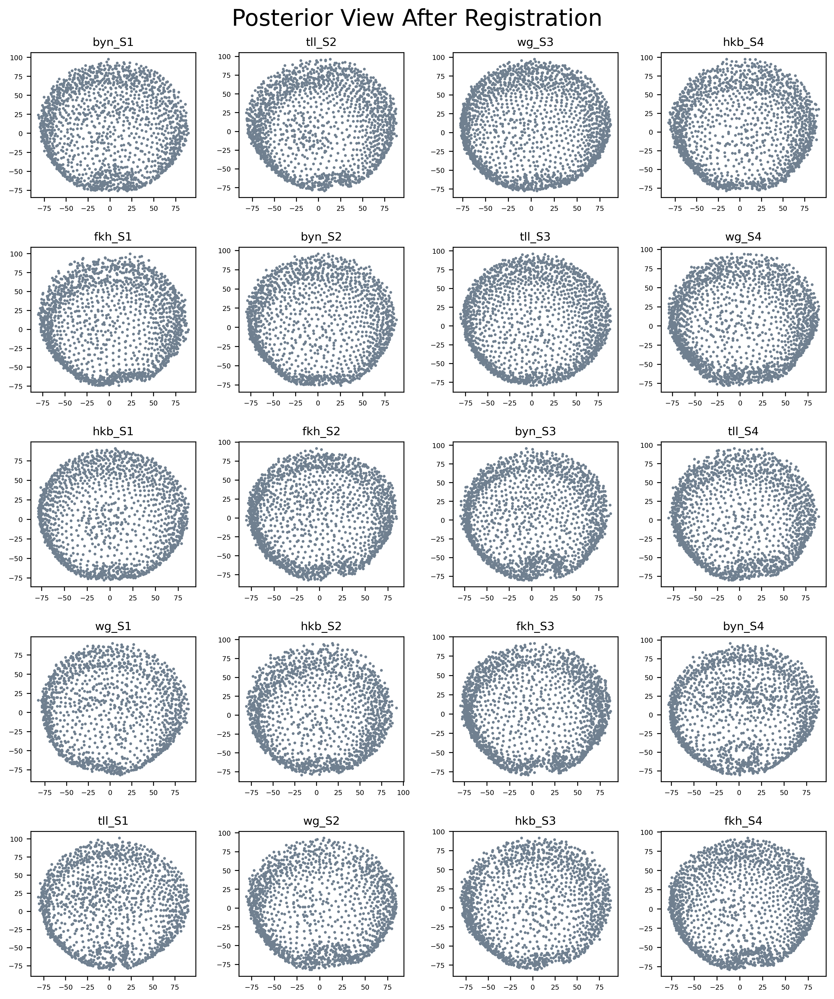

In [112]:
# scaling
import matplotlib.gridspec as gridspec
fig = plt.figure(dpi = 300, figsize = (10,12), constrained_layout=True)
my = gridspec.GridSpec(ncols=4, nrows=5, figure=fig, wspace=0.1, hspace=0.1)
for i, samp in enumerate(no_dsRed):
    row = i // 4
    col = i % 4
    ax = fig.add_subplot(my[row, col])
    ax.tick_params(labelsize= 6)
    tr = icp_transformed[samp].query('Synch_time == '+str(max(to_cons[samp]['Synch_time'])))
    tr = pc.transform(tr[['X', 'Y', 'Z']])
    ax.scatter(tr[:,1], tr[:,2], s = 2, c = 'slategrey')
    ax.set_title(samp.lower().split('_')[0]+'_S'+str(col+1), fontsize = 10)
plt.tight_layout()
plt.suptitle('Posterior View After Registration', fontsize = 20)
#plt.savefig(results_folder+'figures/PV_after_registration_tp_last_no_sample_names.pdf', dpi = 300)


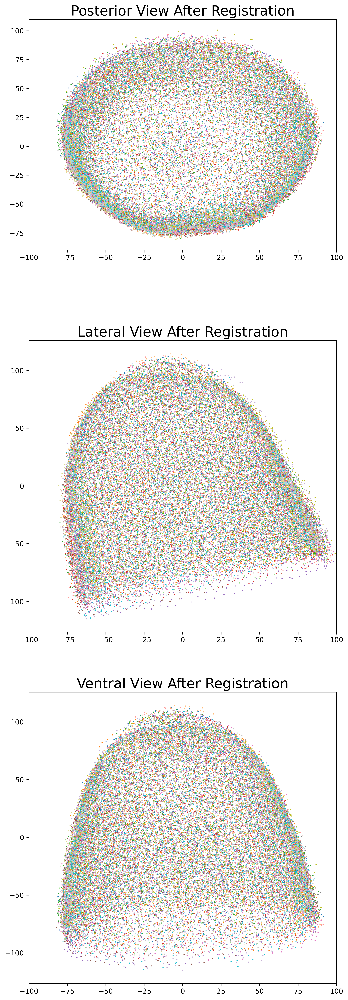

In [107]:
#scaling
fig = plt.figure(figsize = (7,21), dpi = 300)
ax = fig.add_subplot(3,1,1, aspect=0.75)
ax.scatter(pcs[:,1], pcs[:,2], s = 0.5, 
            c = pd.factorize(dat.index.get_level_values(0))[0],
            cmap = 'tab20')
plt.xlim(-100,100)
plt.title('Posterior View After Registration', fontsize = 20)
ax = fig.add_subplot(3,1,2, aspect=0.75)
ax.scatter(pcs[:,2], pcs[:,0], s = 0.5, 
            c = pd.factorize(dat.index.get_level_values(0))[0],
            cmap = 'tab20')
plt.xlim(-100,100)
plt.title('Lateral View After Registration', fontsize = 20)
ax = fig.add_subplot(3,1,3, aspect=0.75)
ax.scatter(pcs[:,1], pcs[:,0], s = 0.5, 
            c = pd.factorize(dat.index.get_level_values(0))[0],
            cmap = 'tab20')
ax.set_xlim(-100,100)
plt.title('Ventral View After Registration', fontsize = 20)
plt.tight_layout()
# fig.savefig(results_folder+'figures/results/Paper_figures/Posterior_and_side_views_after_registration_tp_78.png', dpi = 300)
# fig.savefig(results_folder+'figures/results/Paper_figures/Posterior_and_side_views_after_registration_tp_78.svg', dpi = 300)

### How good is this synch?

In [114]:
all_icp = pd.read_csv('./dat/icp_transformed_scaled.csv', index_col = [0,1])

### Normalized number of nuclei

In [115]:
tot_nucl = all_icp.loc[no_dsRed].groupby(['sample', 'Synch_time']).size()

In [116]:
tot_nucl = tot_nucl.loc[no_dsRed]

In [117]:
tot = tot_nucl.unstack('Synch_time').loc[no_dsRed]
mean_14 = pd.DataFrame(tot_nucl).query('Synch_time>26').unstack('Synch_time').mean(1).loc[no_dsRed]
norm_tot = tot.div(mean_14,0)

In [118]:
new_names = []
gene_counts = {}
genes = ['Byn', 'Tll', 'Wg', 'Fkh', 'Hkb']
for g in genes:
    gene_counts[g] = 0
for s in no_dsRed:
    g = s.split('_')[0]
    gene_counts[g]+=1
    new_names.append(g.lower()+'_S'+str(gene_counts[g]))

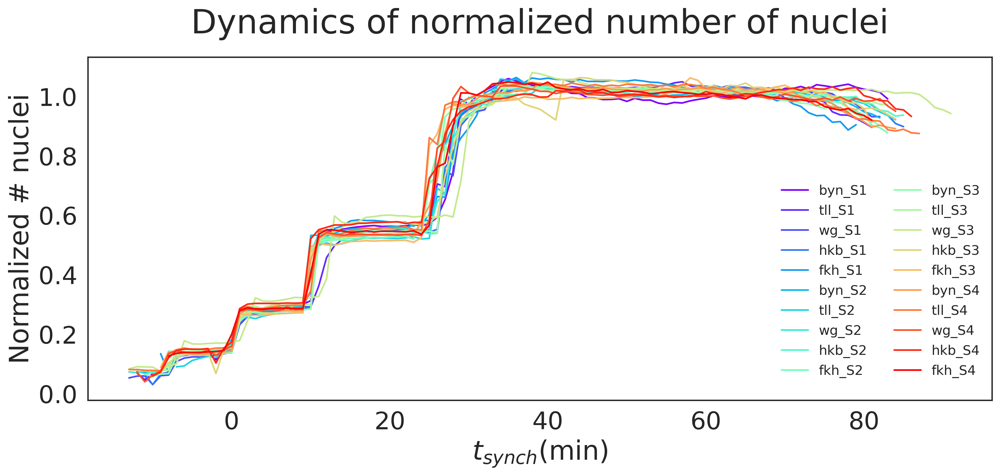

In [119]:
sns.set(style = 'white', font_scale = 2)
fig, ax = plt.subplots(figsize = (13,6.5), dpi = 300)
g = norm_tot.T.plot(ax = ax, colormap = 'rainbow')
ax.legend(labels = new_names, frameon=False, loc='lower right', 
          bbox_to_anchor = [1.,0.03], ncol=2, fontsize = 12)
ax.set_xlabel(r'$t_{synch}$(min)')
ax.set_ylabel('Normalized # nuclei')
plt.title('Dynamics of normalized number of nuclei', size = 30, y = 1.05)
plt.tight_layout()
#g.set_aspect(100)
# plt.savefig(results_folder+'figures/Dynamics_normalized_nuclei.png', dpi = 300)
# plt.savefig(results_folder+'figures/Dynamics_normalized_nuclei.svg', dpi = 300)

### Time

In [120]:
genes_to_consider = ['Tll', 'Hkb', 'Byn', 'Fkh', 'Wg']

In [121]:
all_by_samp = pd.concat(to_cons).reset_index(level = 1)

In [122]:
all_by_samp['Expr'] = (all_by_samp['No_children']==2).astype(bool)

In [123]:
mean_nuc = all_by_samp.groupby(['level_1', 'Synch_time', 'Cycle']).size().groupby(['level_1', 'Cycle']).mean()

In [124]:
no_nuclei = all_by_samp.groupby(['level_1', 'Synch_time', 'Cycle']).size().unstack('Synch_time').fillna(0)

In [128]:
import copy
stacked_bool_sum = copy.deepcopy(all_by_samp.fillna(0))
stacked_bool_sum['Expr_intensity'] = stacked_bool_sum['Expr_intensity'].astype(bool)
stacked_bool_sum = stacked_bool_sum.groupby(['Gene', 'level_1','Synch_time']).sum()['Expr_intensity'].reset_index()
stacked_bool_sum.columns = ['Gene', 'sample','Synch_time', 'Expression_intensity']

In [129]:
stacked_bool_sum_to_cons = stacked_bool_sum.query('Gene in '+str(genes_to_consider))
stacked_bool_sum_to_cons_rel = stacked_bool_sum_to_cons.query('sample in '+str(no_dsRed))

In [130]:
sns.set(font_scale = 2)
sns.set_style('white')

<Figure size 3900x2100 with 0 Axes>

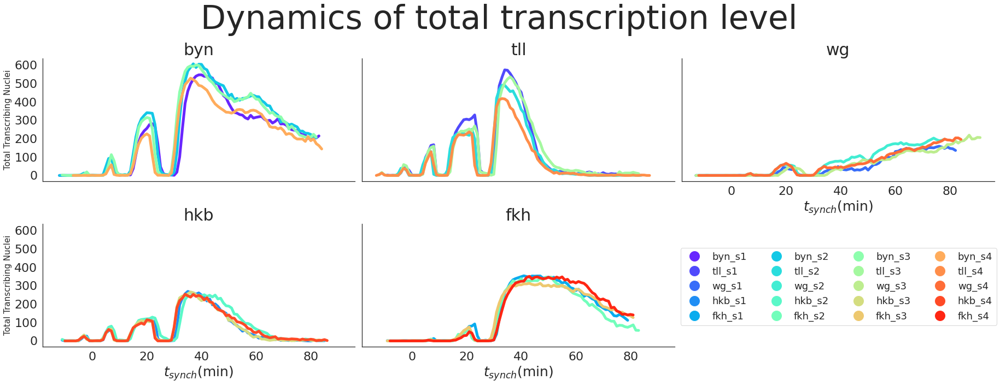

In [132]:
fig = plt.figure(figsize = (13, 7), dpi = 300)
sns.set(font_scale = 2, style = 'white')
g = sns.relplot(height=5, aspect=1.5/1,
                data =stacked_bool_sum_to_cons_rel.set_index(['sample']).loc[no_dsRed].reset_index(),kind = 'line', 
            x = 'Synch_time', 
            y = 'Expression_intensity', 
            col = 'Gene',
            hue = 'sample',#red_samples,
            col_wrap = 3, 
            lw = 5, 
                #markers = ['o'],
            palette = 'rainbow')#,
axes = g.axes.flatten()
for i,ax in enumerate(axes):
    ax.set_title(aliases[i].lower(), fontsize = 30,)
    ax.set_ylabel('Total Transcribing Nuclei', fontsize = 15)
    ax.set_xlabel(r'$t_{synch}$(min)', fontsize = 25)
plt.suptitle('Dynamics of total transcription level', fontsize = 60)
h,l = g.axes[0].get_legend_handles_labels()
l = new_names
g._legend.remove()
# def flip(items, ncol):
#     return itertools.chain(*[items[i::ncol] for i in range(ncol)])
markers = dict(zip(h,l))
from matplotlib.lines import Line2D
legend_elements = []
for key, value in markers.items():
    legend_elements.append(Line2D([0], [0], markersize=20, marker='o',color = 'w', markerfacecolor = key.get_c(),
                                  label=key))
g.fig.legend(#flip(legend_elements,4),
             #flip([x.lower() for x in l], 4), 
             legend_elements,
             [x.lower() for x in l], 
             ncol = 4, 
             loc = 'lower right',
             #markers = ['o'],
             bbox_to_anchor = [1,0.15],
             fontsize = 18)
sns.set(style='white')
plt.tight_layout()
# g.savefig(results_folder+'figures/Total_binarized_transciption_level.png', dpi = 300)
# g.savefig(results_folder+'figures/Total_binarized_transciption_level.svg', dpi = 300)